# InstantTexture

Convert a vertex-colored mesh to a uv-mapped, textured mesh.

Before running, change the runtime type of the notebook to GPU: `Runtime -> Change runtime type -> Hardware accelerator -> GPU`.

## The Short Version

### Installation

Install the [InstantTexture](https://github.com/dylanebert/InstantTexture) library for easy conversion.

For a detailed explanation, see [The Long Version](#the-long-version) below.

In [ ]:
%pip install git+https://github.com/dylanebert/InstantTexture

### Usage

The code below converts a vertex-colored `.obj` mesh to a uv-mapped, textured `.glb` mesh and saves it to `output.glb`.

In [ ]:
from instant_texture import Converter

input_mesh_path = "https://raw.githubusercontent.com/dylanebert/InstantTexture/refs/heads/main/examples/chair.obj"

converter = Converter()
converter.convert(input_mesh_path)

Let's visualize the output mesh.

In [ ]:
import trimesh

mesh = trimesh.load("output.glb")
mesh.show()

That's it!

For a detailed walkthrough, continue reading.

## The Long Version

### Installation

Install the following dependencies:

- **numpy** for numerical operations
- **trimesh** for loading and saving mesh data
- **xatlas** for generating uv maps
- **Pillow** for image processing
- **opencv-python** for image processing
- **httpx** for downloading the input mesh

In [ ]:
%pip install numpy trimesh xatlas opencv-python pillow httpx

Import dependencies.

In [6]:
import cv2
import numpy as np
import trimesh
import xatlas
from PIL import Image, ImageFilter

Load the vertex-colored input mesh.

If it's a local file, use `trimesh.load()` instead of `trimesh.load_remote()`.

In [10]:
mesh = trimesh.load_remote(input_mesh_path)
mesh.show()

Access the vertex colors of the mesh.

If this fails, ensure the mesh is a valid `.obj` file with vertex colors.

In [11]:
vertex_colors = mesh.visual.vertex_colors

Generate the uv map using xatlas.

This is the most time-consuming part of the process.

In [12]:
vmapping, indices, uvs = xatlas.parametrize(mesh.vertices, mesh.faces)

Remap the vertices and vertex colors to the uv map.

In [13]:
vertices = mesh.vertices[vmapping]
vertex_colors = vertex_colors[vmapping]

mesh.vertices = vertices
mesh.faces = indices

Define the desired texture size.

Construct a texture buffer that is upscaled by an `upscale_factor` to create a higher quality texture.

In [14]:
texture_size = 1024

upscale_factor = 2
buffer_size = texture_size * upscale_factor

texture_buffer = np.zeros((buffer_size, buffer_size, 4), dtype=np.uint8)

Fill in the texture of the UV-mapped mesh using barycentric interpolation.

1. **Barycentric interpolation**: Computes the interpolated color at point `p` inside a triangle defined by vertices `v0`, `v1`, and `v2` with corresponding colors `c0`, `c1`, and `c2`.
2. **Point-in-Triangle test**: Determines if a point `p` lies within a triangle defined by vertices `v0`, `v1`, and `v2`.
3. **Texture-filling loop**:
    - Iterate over each face of the mesh.
    - Retrieve the UV coordinates (`uv0`, `uv1`, `uv2`) and colors (`c0`, `c1`, `c2`) for the current face.
    - Convert the UV coordinates to buffer coordinates.
    - Determine the bounding box of the triangle on the texture buffer.
    - For each pixel in the bounding box, check if the pixel lies within the triangle using the point-in-triangle test.
    - If inside, compute the interpolated color using barycentric interpolation.
    - Assign the color to the corresponding pixel in the texture buffer.

In [15]:
# Barycentric interpolation
def barycentric_interpolate(v0, v1, v2, c0, c1, c2, p):
    v0v1 = v1 - v0
    v0v2 = v2 - v0
    v0p = p - v0
    d00 = np.dot(v0v1, v0v1)
    d01 = np.dot(v0v1, v0v2)
    d11 = np.dot(v0v2, v0v2)
    d20 = np.dot(v0p, v0v1)
    d21 = np.dot(v0p, v0v2)
    denom = d00 * d11 - d01 * d01
    if abs(denom) < 1e-8:
        return (c0 + c1 + c2) / 3
    v = (d11 * d20 - d01 * d21) / denom
    w = (d00 * d21 - d01 * d20) / denom
    u = 1.0 - v - w
    u = np.clip(u, 0, 1)
    v = np.clip(v, 0, 1)
    w = np.clip(w, 0, 1)
    interpolate_color = u * c0 + v * c1 + w * c2
    return np.clip(interpolate_color, 0, 255)


# Point-in-Triangle test
def is_point_in_triangle(p, v0, v1, v2):
    def sign(p1, p2, p3):
        return (p1[0] - p3[0]) * (p2[1] - p3[1]) - (p2[0] - p3[0]) * (p1[1] - p3[1])

    d1 = sign(p, v0, v1)
    d2 = sign(p, v1, v2)
    d3 = sign(p, v2, v0)

    has_neg = (d1 < 0) or (d2 < 0) or (d3 < 0)
    has_pos = (d1 > 0) or (d2 > 0) or (d3 > 0)

    return not (has_neg and has_pos)

# Texture-filling loop
for face in mesh.faces:
    uv0, uv1, uv2 = uvs[face]
    c0, c1, c2 = vertex_colors[face]

    uv0 = (uv0 * (buffer_size - 1)).astype(int)
    uv1 = (uv1 * (buffer_size - 1)).astype(int)
    uv2 = (uv2 * (buffer_size - 1)).astype(int)

    min_x = max(int(np.floor(min(uv0[0], uv1[0], uv2[0]))), 0)
    max_x = min(int(np.ceil(max(uv0[0], uv1[0], uv2[0]))), buffer_size - 1)
    min_y = max(int(np.floor(min(uv0[1], uv1[1], uv2[1]))), 0)
    max_y = min(int(np.ceil(max(uv0[1], uv1[1], uv2[1]))), buffer_size - 1)

    for y in range(min_y, max_y + 1):
        for x in range(min_x, max_x + 1):
            p = np.array([x + 0.5, y + 0.5])
            if is_point_in_triangle(p, uv0, uv1, uv2):
                color = barycentric_interpolate(uv0, uv1, uv2, c0, c1, c2, p)
                texture_buffer[y, x] = np.clip(color, 0, 255).astype(
                    np.uint8
                )

Let's visualize how the texture looks so far.

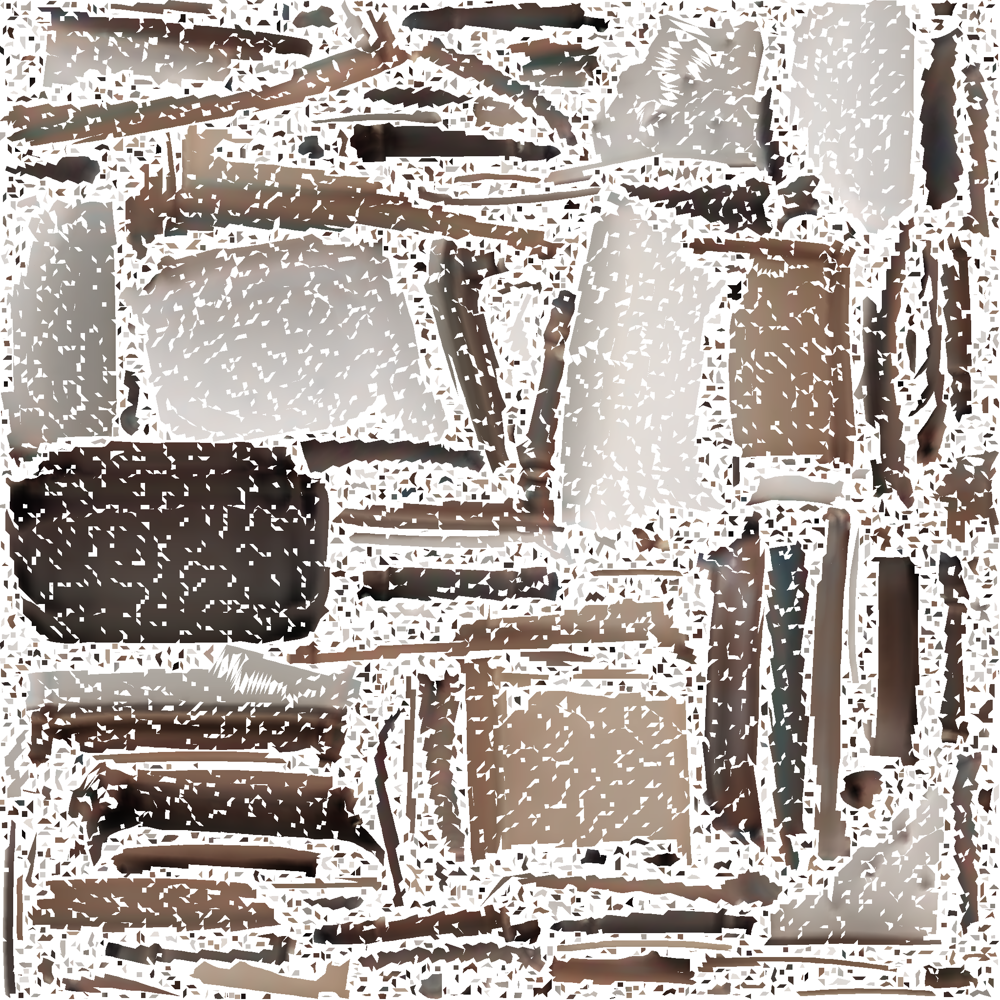

In [17]:
from IPython.display import display

image_texture = Image.fromarray(texture_buffer)
display(image_texture)

As we can see, the texture has a lot of holes.

To correct for this, we'll combine 4 techniques:
1. **Inpainting**: Fill in the holes using the average color of the surrounding pixels.
2. **Median filter**: Remove noise by replacing each pixel with the median color of its surrounding pixels.
3. **Gaussian blur**: Smooth out the texture to remove any remaining noise.
4. **Downsample**: Resize down to `texture_size` with LANCZOS resampling.

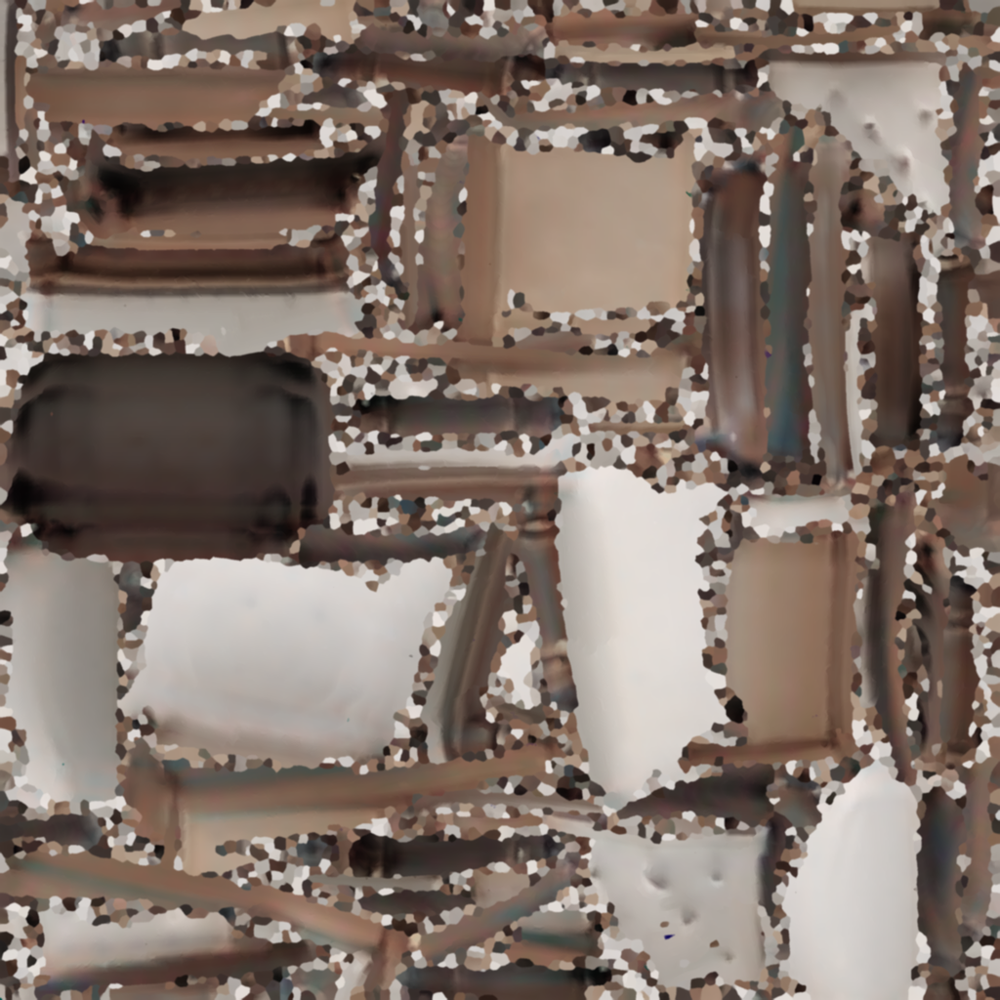

In [18]:
# Inpainting
image_bgra = texture_buffer.copy()
mask = (image_bgra[:, :, 3] == 0).astype(np.uint8) * 255
image_bgr = cv2.cvtColor(image_bgra, cv2.COLOR_BGRA2BGR)
inpainted_bgr = cv2.inpaint(
    image_bgr, mask, inpaintRadius=3, flags=cv2.INPAINT_TELEA
)
inpainted_bgra = cv2.cvtColor(inpainted_bgr, cv2.COLOR_BGR2BGRA)
texture_buffer = inpainted_bgra[::-1]
image_texture = Image.fromarray(texture_buffer)

# Median filter
image_texture = image_texture.filter(ImageFilter.MedianFilter(size=3))

# Gaussian blur
image_texture = image_texture.filter(ImageFilter.GaussianBlur(radius=1))

# Downsample
image_texture = image_texture.resize((texture_size, texture_size), Image.LANCZOS)

# Display the final texture
display(image_texture)

As we can see, the texture is now much smoother and has no holes.

This can be further improved with more advanced techniques or manual texture editing.

Finally, we can construct a new mesh with the generated uv coordinates and texture.

In [19]:
material = trimesh.visual.material.PBRMaterial(
    baseColorFactor=[1.0, 1.0, 1.0, 1.0],
    baseColorTexture=image_texture,
    metallicFactor=0.0,
    roughnessFactor=1.0,
)

visuals = trimesh.visual.TextureVisuals(uv=uvs, material=material)
mesh.visual = visuals
mesh.show()

Et voilà! The mesh is UV-mapped and textured.

To export it when running locally, call `mesh.export("output.glb")`.

## Limitations

As you can see, the mesh still has many small artifacts.

The quality of the UV map and texture are also far below the standards of a production-ready mesh.

However, if you're looking for a quick solution to map from a vertex-colored mesh to a uv-mapped mesh, then this approach may be useful for you.


### Conclusion

This tutorial walked through how to convert a vertex-colored mesh to a uv-mapped, textured mesh.

Thank you for reading!